# Housing Prices Prediction
## Problem Statement
> **Can we use machine learning to help prospective home buyers and sellers in King County evaluate the market value of a house?**

### Problem Understanding
Typically in the process of buying or selling a house, a home owner would hire a real estate agent to make an appraisal of the market value of a house. This appraisal then helps them decide on the best listing price of a property. Such valuations would typically be based on certain factors like the size of the house, and other indicators of value like pools, and garages.

#### King County 
![](https://www.mapsofworld.com/usa/states/washington/maps/king-wa-county-map.jpg)
King County is located in the US State of Washington. It is on the west coast of the US. 

Key Geographical Parts of King County Include:
- City of Seattle (largest city in Washington)
- Lake Washington (largest lake in KC)
- Lake Sammamish
- Lake Union 
- Airports (located in the middle and south part of KC)
- Cascade Range (a series of mountains on the east side of King County)
- Vashon Island (connected to West Seattle)
- Mercer Island

Hence our objectives would be to:
- create a model that can supplement a real estate appraisal to help home buyers/sellers in King County make better decisions
- extract insights as to how important different factors affect housing prices in King County.
## Evaluation Metrics
### Benchmark
While the US does not appear to set any margin of error for a real estate appraisal, UK case law says that the margin of error of the appraised value from the actual value should not generally exceed 15%. The typical margin of error is 5% for simple residential property valuations.

Hence, for our model to be reliable, we would expect a margin of error of less than 15% from the actual value. One way to interpret this would be a Mean Absolute Percentage Error of less than 15%. 

## Importing Libraries

In [1]:
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from tqdm import tqdm
sns.set()

# Util
from custom_util import outlierDetection, removeOutliers


# Experimental
from sklearn.experimental import enable_halving_search_cv, enable_hist_gradient_boosting

# Base Classes
from sklearn.base import BaseEstimator, TransformerMixin

# Model Evaluation
from sklearn.model_selection import train_test_split, cross_validate, KFold
from yellowbrick.model_selection import learning_curve, feature_importances
from yellowbrick.regressor import residuals_plot
from sklearn.inspection import permutation_importance

# Data Preprocessing
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, TransformedTargetRegressor
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, QuantileTransformer


# Models
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor, HistGradientBoostingRegressor

# Hyperparameter Tuning
from sklearn.model_selection import HalvingRandomSearchCV, HalvingGridSearchCV
from yellowbrick.model_selection import validation_curve

# Feature Selection
from sklearn.feature_selection import SelectFromModel, RFECV, SelectKBest, SequentialFeatureSelector, chi2, mutual_info_classif

# Random State Instance. Using a RandomState instance sets the seed for the RNG generator. This allows for reproducible results, while still ensuring robust results (e.g. not overfitting to the random state)
random_state = np.random.RandomState(42) # also note that for cross validation, the splitter will be passed an integer while the actual estimator will be passed the random state instance, as recommended by scikit-learn documentation.

## Data Ingestion

In [16]:
house_df = pd.read_csv("kc_house_data.csv")
house_df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


## Data Exploration

### Dataset Description
This dataset contains house sale prices for King County, which includes Seattle. It includes homes sold between May 2014 and May 2015.

### Dataset Dictionary
| Column | Data Type | Remarks |
|---|---|---|
| id | Integer (Nominal) | Unique ID for each house |
| date | Date | Need to convert to dt format from string |
| price | Float (Continuous) | Target Variable. Price of House in USD |
| bedrooms | Integer (Discrete) | No. of Bedrooms in the House |
| bathrooms | Float (Discrete) | Quarter of a bathroom is a bathroom with a toilet only, no shower |
| sqft_living | Float (Continuous) | Square footage of the inside of the house |
| sqft_lot | Float (Continuous) | Square footage of the entire home, including the exterior |
| floors | Float (Discrete) | Includes split level home|
| waterfront | Integer (Boolean) | Is the property a waterfront property? |
| view | Integer (Ordinal) | On a scale of 0 to 4, how good is the view of the property |
| condition | Integer (Ordinal) | On a scale of 1 to 5, how good is the condition of the house |
| grade | Integer (Ordinal) | On a scale of 1 to 13, how good is the quality of the house |
| sqft_above | Float (Continuous) | Square footage of the parts of the house above the first floor |
| sqft_basement | Float (Continuous) | Square footage of the basement of the house |
| yr_built | Integer (Discrete) | Year of Construction |
| yr_renovated | Integer (Discrete) | Year of latest renovation |
| zipcode | Integer (Nominal) | zipcode of house |
| lat | Float (Continuous) | Latitude (North-South)|
| long | Float (Continuous) | Longitude (East-West)|
| sqft_living15 | Float (Continuous)|Average Sqft_Living for nearest 15 houses |
| sqft_lot15 | Float (Continuous) | Average Sqft_lot for nearest 15 houses |

### Objectives
- How many rows and how many columns are there?
- What does the target variable look like?
- What is the distribution of the numerical columns?
- What is the distribution of the categorical columns?
- Are there any missing values and how many of them are there?
- Are there any outliers in the data?
- How are the various columns correlated to the target variable?


In [17]:
house_eda = house_df.copy() # Make a copy the dataframe to do eda on

### Univariate Analysis

#### Descriptive Analysis

In [18]:
house_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

- There are 21613 rows and 21 columns.
- There appear to be no missing values in the data.
- `date` has an incorrect data type. It should be represented as a date instead of a string.

In [19]:
house_eda.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


- Housing Prices are likely to be positively skewed with many outliers, as the max price of the houses is much larger than the upper quartile.
- Similarly, living space and lot space also has a positively skewed distribution.
- Most houses are not waterfront properties (at least 75%)
- Most houses have 0 basement space. 
- At least 75% of houses have never been renovated.

#### Target Variable
The target variable we are trying to predict is the price in USD of the house.

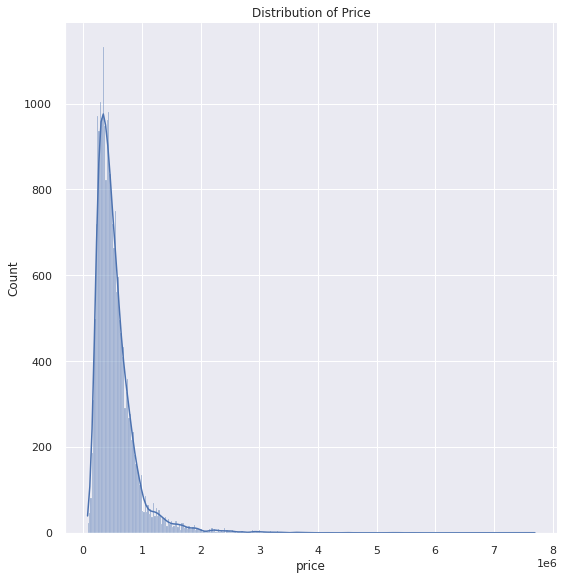

In [20]:
sns.displot(data=house_eda, x="price", kde=True, height = 8)
plt.title("Distribution of Price")
plt.show()

We note that the distribution of the price is heavily positively skewed. Most houses are less than $100K USD, but some houses cost more than a million. This suggests that the mean and standard deviation of the price might not be the best descriptor of it's distribution.

In [21]:
price_median = house_eda["price"].median() 
price_iqr = house_eda["price"].quantile(.75) - house_eda["price"].quantile(.25) 
print(f"Median Price: ${price_median}, Price IQR: ${price_iqr}")

Median Price: $450000.0, Price IQR: $323050.0


When looking at the median price, we note that while it is still quite high, the prices are more reasonable.

Shape Before Removing Outliers: (21613, 1)
Shape After Removing Outliers: (20467, 1)


<AxesSubplot:xlabel='price'>

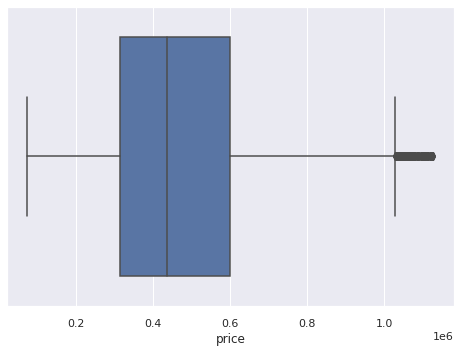

In [22]:
sns.boxplot(x="price", data = removeOutliers(house_eda[["price"]]))

When the extreme values are removed, we can see the typical distribution more clearly.

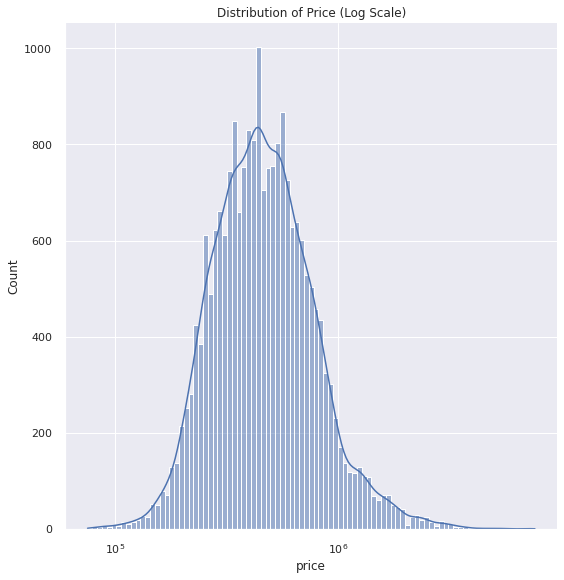

In [23]:
sns.displot(data=house_eda, x="price", kde=True, log_scale=True,height = 8)
plt.title("Distribution of Price (Log Scale)")
plt.show()

When plotted on a log scale, the prices appear to follow a normal distribution. This suggests that prices in King County follow a log normal distribution, suggesting that transformation of the target variable to accurately reflect this might improve the performance of the model.

#### Numerical Features

In [24]:
numerical_features = ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15', 'sqft_lot15', 'lat', 'long']

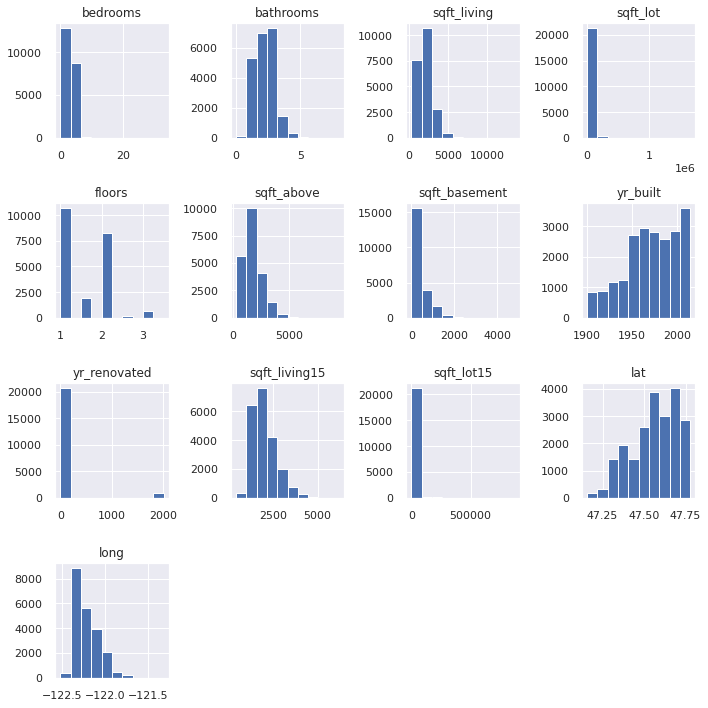

In [25]:
house_eda[numerical_features].hist(figsize=(10, 10))
plt.tight_layout()
plt.show()

Based on the histograms, we see that
- Living area appears to be positively skewed
- Most houses have never been renovated, as suggested by most having a year of 0 (a prefilled indicator value)
- Most houses were constructed after 1950
- Most houses have very similar and small lot sizes. 

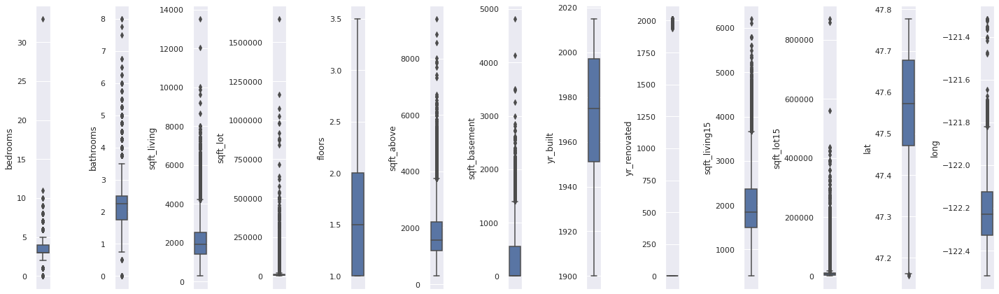

In [26]:
fig, ax = plt.subplots(1, len(numerical_features), figsize=(20, 6), tight_layout = True)

for idx, col in enumerate(numerical_features):
    ax[idx].ticklabel_format(useOffset=False, style='plain') # do not use scientific notation
    sns.boxplot(data = house_eda, y=col, ax = ax[idx])
fig.show()

From the boxplots we note that
- There is one extreme outlier house with more than 30 bedrooms. 
- While most houses have low lot sizes, a few have extremely large lot sizes, presumably located in more rural areas, but this will have to be investigated further.

In [27]:
house_eda["age"] = house_eda["date"].dt.year - house_eda["yr_built"]
house_eda["age"].hist()
plt.title("Distribution of Property Age")
plt.show()


AttributeError: Can only use .dt accessor with datetimelike values

Most houses are between 20 and 60 years of age. The distribution of age is positively skewed, with a few houses being very old (>100 years old)

In [45]:
def cat_plot(df, features, figsize = (10, 20)):
    fig, ax = plt.subplots(len(features), 1, figsize= figsize, tight_layout = True)
    for idx, feature in enumerate(features):
        ax[idx].set_title("Counts of " + feature)
        # counts = df[feature].value_counts()
        sns.countplot(data = df, y = feature, ax = ax[idx])
    return fig

We want to investigate values of discrete data further.

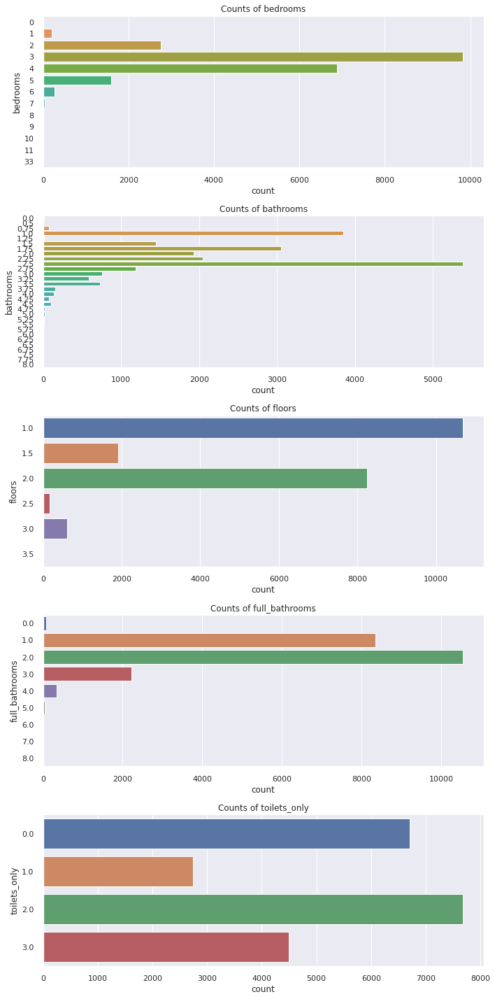

In [48]:
house_eda["full_bathrooms"] = house_eda["bathrooms"].apply(lambda x : np.floor(x))
house_eda["toilets_only"] = (house_eda["bathrooms"] - house_eda["full_bathrooms"]) / 0.25
count_data = ["bedrooms", "bathrooms", "floors", "full_bathrooms", "toilets_only"]
fig = cat_plot(house_eda, count_data)

Most houses have:
- 3 Bedrooms
- 2 Full Bathrooms (shower)
- 2 Toilets
- 1 Floor

We note that some houses are split level properties.

Strangely we also see a few houses apparently have zero bedrooms and zero bathrooms. These must be investigated later on.

#### Categorical Features

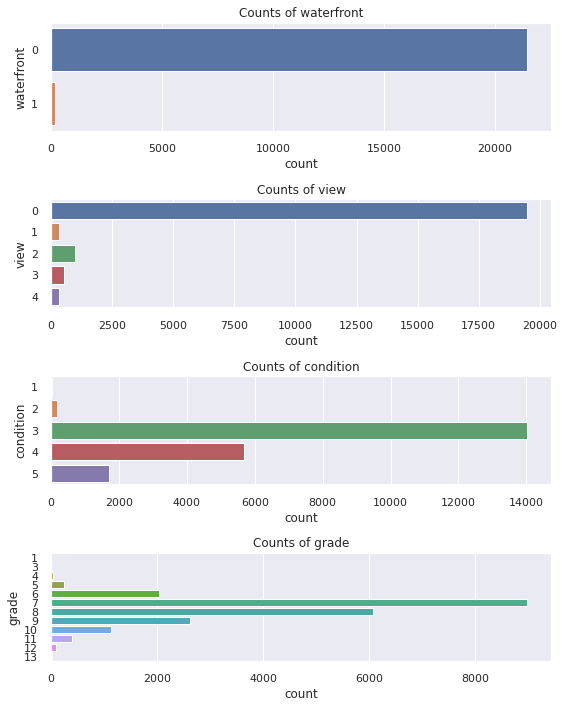

In [52]:
categorical_features = ['waterfront', 'view', 'condition', 'grade']
fig = cat_plot(house_eda, categorical_features, figsize=(8, 10))

Most houses:
- are not waterfront properties
- have a poor view 
- are of average condition
- have a grade of 7 (average quality)

#### Time Series Features

In [17]:
house_eda["date"] = pd.to_datetime(house_eda["date"])
house_eda["month"] = house_eda["date"].dt.month

<AxesSubplot:xlabel='month', ylabel='count'>

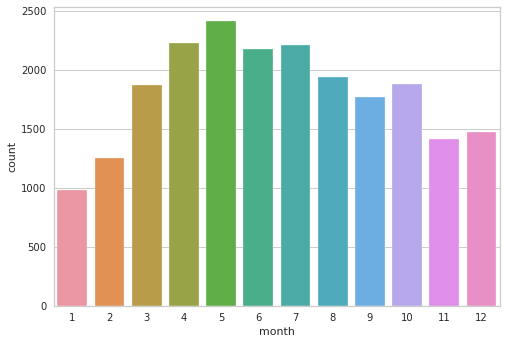

In [23]:
sns.countplot(x="month", data=house_eda)

Most houses are sold between April (4th month) and August (8th Month). The least houses are sold in January and Feburary.

#### Investigating Outliers & Anomalies

We start by investigating those properties which are an outlier in terms of their number of bedrooms.

Outliers in Series (First 5)
             id             date     price  bedrooms  bathrooms  sqft_living  \
154  7920100045  20140516T000000  350000.0         1       1.00          700   
209  6300000550  20140717T000000  464000.0         6       3.00         2300   
232  9264902050  20141121T000000  315000.0         6       2.75         2940   
239  5152100060  20140529T000000  472000.0         6       2.50         4410   
264  2123039032  20141027T000000  369900.0         1       0.75          760   

     sqft_lot  floors  waterfront  view  ...  sqft_basement  yr_built  \
154      5100     1.0           0     0  ...              0      1942   
209      3404     2.0           0     0  ...            700      1920   
232      7350     1.0           0     0  ...           1160      1978   
239     14034     1.0           0     2  ...           2060      1965   
264     10079     1.0           1     4  ...              0      1936   

     yr_renovated  zipcode      lat     long  sqft_

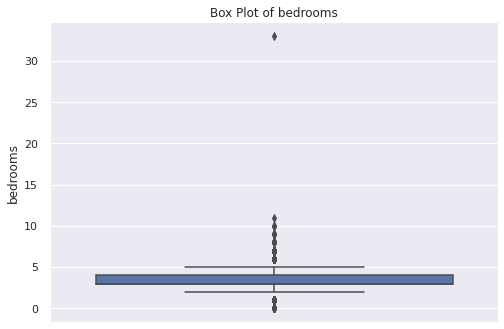

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,full_bathrooms,toilets_only
9854,7849202190,20141223T000000,235000.0,0,0.00,1470,4800,2.0,0,0,...,0,1996,0,98065,47.5265,-121.828,1060,7200,0.0,0.0
14423,9543000205,20150413T000000,139950.0,0,0.00,844,4269,1.0,0,0,...,0,1913,0,98001,47.2781,-122.250,1380,9600,0.0,0.0
875,6306400140,20140612T000000,1095000.0,0,0.00,3064,4764,3.5,0,2,...,0,1990,0,98102,47.6362,-122.322,2360,4000,0.0,0.0
8477,2569500210,20141117T000000,339950.0,0,2.50,2290,8319,2.0,0,0,...,0,1985,0,98042,47.3473,-122.151,2500,8751,2.0,2.0
3467,1453602309,20140805T000000,288000.0,0,1.50,1430,1650,3.0,0,0,...,0,1999,0,98125,47.7222,-122.290,1430,1650,1.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13314,627300145,20140814T000000,1148000.0,10,5.25,4590,10920,1.0,0,2,...,2090,2008,0,98004,47.5861,-122.113,2730,10400,5.0,1.0
19254,8812401450,20141229T000000,660000.0,10,3.00,2920,3745,2.0,0,0,...,1060,1913,0,98105,47.6635,-122.320,1810,3745,3.0,0.0
15161,5566100170,20141029T000000,650000.0,10,2.00,3610,11914,2.0,0,0,...,600,1958,0,98006,47.5705,-122.175,2040,11914,2.0,0.0
8757,1773100755,20140821T000000,520000.0,11,3.00,3000,4960,2.0,0,0,...,600,1918,1999,98106,47.5560,-122.363,1420,4960,3.0,0.0


In [56]:
outlierDetection(house_eda, "bedrooms")

Earlier, we noted those houses with no bedrooms and bathrooms were suspicious. It turns out from research that these places actually correspond to empty lots which are bing sold. Hence, they are not data entry errors, but represent a specific type of property. Since they are outliers, we may want to consider removing them from training to improve any future models.

### Bivariate Analysis

In [18]:
house_corr = house_eda.drop(['id', 'zipcode', 'date'], axis=1).corr()


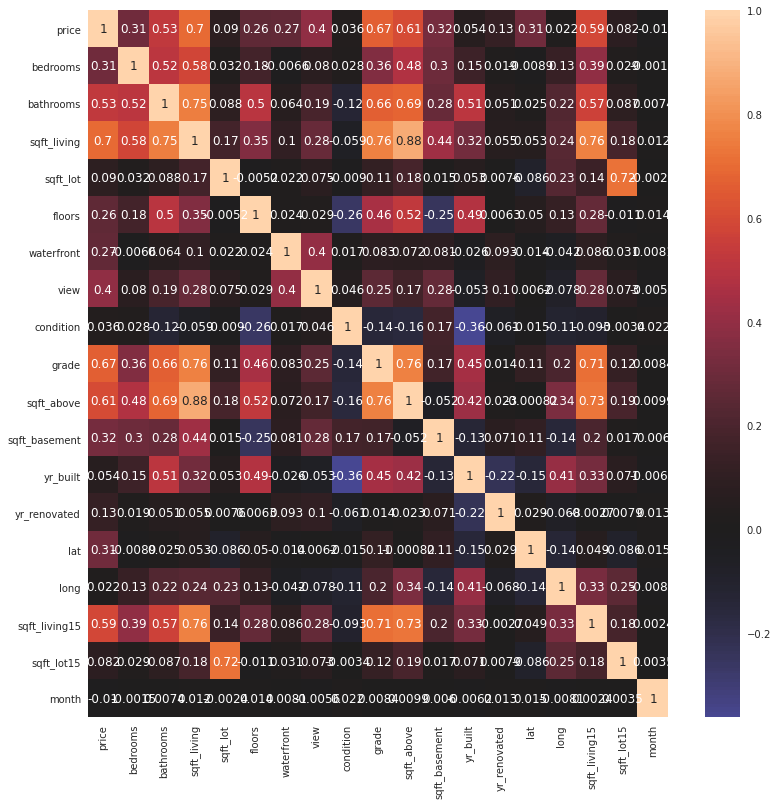

In [19]:
fig, ax = plt.subplots(figsize=(13, 13))
sns.heatmap(house_corr, ax = ax, annot = True, center = 0)
fig.show()

#### Geographical Analysis

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


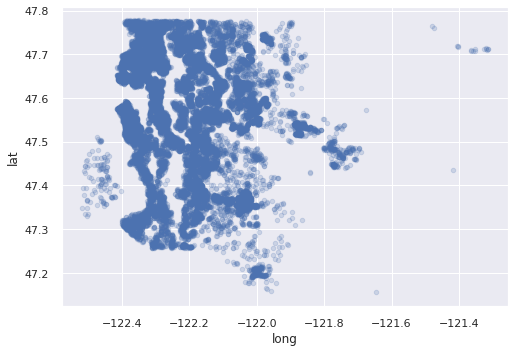

In [29]:
geographical_features = ["lat", "long"]
house_eda.plot(kind='scatter', x='long', y='lat', alpha=.2)
plt.show()

We see that most properties are in the more urbanised parts of King County (corresponding to Seattle, Renton, Kent)

Vashon Island is more rural in nature based on research, and hence has lower density of properties.

##### Is there a rural-urban divide? (Which parts of the city have more value)

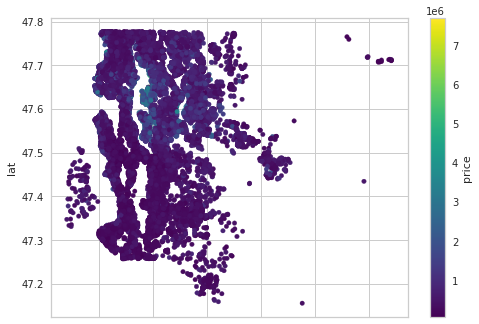

In [28]:
house_eda.plot(kind='scatter', x='long', y='lat', c='price', cmap='viridis')
plt.show()

We see that properties in the North appear to have higher values. Notably, they seem to be clustered in more urban areas.

##### Do waterfront properties hold more value?

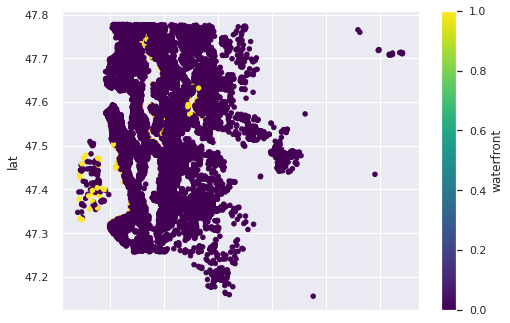

In [28]:
house_eda.plot(kind='scatter', x='long', y='lat', c='waterfront', cmap='viridis')
plt.show()

We note that properties near the lakes seem to hold more value. This could however be simply because these lakes are nearer to the city.

#### Time Series Analysis

In [43]:
house_eda["month"] = pd.to_datetime(house_eda["date"]).dt.month

<AxesSubplot:xlabel='month', ylabel='price'>

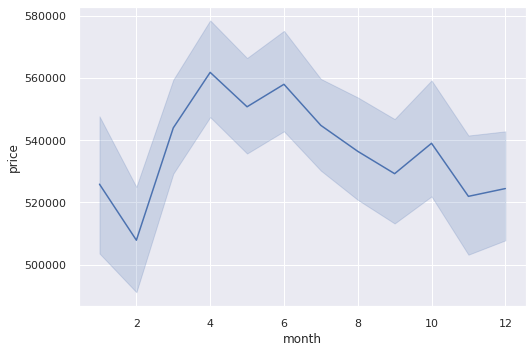

In [46]:
sns.lineplot(x="month", y="price", data = house_eda)

We see that price does appear to increase in earlier months, these months also correspond to months with higher demand for housing (as we saw earlier, most houses were sold in earlier months)

## Data Preparation

### Separate Target & Features

In [30]:
X, y = house_df.drop("price", axis = 1), house_df["price"]

### Dropping Uninformative Columns
- We will drop zipcode, id and date since based on our eda, these columns have relatively little utility, and having the zipcode would greatly increase the dimensionality of our data due to the need to one hot encode the data.

In [33]:
X.drop(["zipcode", "id", "date"], axis=1, inplace=True)

### Create Hold-Out Set

In [34]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, shuffle=True,random_state = random_state)

### Data Pre-processing Pipeline
For our inital pre-processing steps, we will attempt:


#### Scaling
- Since many of the numerical features are on different scales, we will perform feature scaling to standarize their values


In [47]:
data_preprocessing = Pipeline([
    ('Feature Scaling (Standardization)', StandardScaler())
])

## Modelling
### Evaluation Methodology
To evaluate our model, we will make use of 

In [55]:
def evaluate_candidate_model(reg, X, y, metrics = ["neg_median_absolute_error", "neg_mean_absolute_percentage_error","neg_root_mean_squared_error"], cv = KFold(n_splits = 5, shuffle = True, random_state = 42), model_name = None, history = pd.DataFrame(), return_estimator = False, return_learning_curve = True):
    model_name = model_name if model_name is not None else type(reg).__name__
    single_metric = type(metrics) in { str, callable }
    scores = cross_validate(reg, X, y, cv = cv, scoring = metrics, return_train_score = True, return_estimator = return_estimator, n_jobs= -1)
    if return_estimator:
        best_estimator = scores["estimator"][np.argmax(scores["test_neg_mean_absolute_error"])]
        del scores["estimator"]
    scores = pd.DataFrame(scores).describe().iloc[1:3, 2:].round(5) # Get Summarized Cross Val Scores
    his_snapshot = scores.iloc[0, :]
    his_snapshot.rename(index=model_name, inplace=True)
    history = history.append(his_snapshot)
    lr = learning_curve(reg, X, y, scoring = metrics[0], cv = cv, n_jobs=-1)
    return scores, history, lr, best_estimator if return_estimator else None

### Baseline Model (Mean Value Predictor)

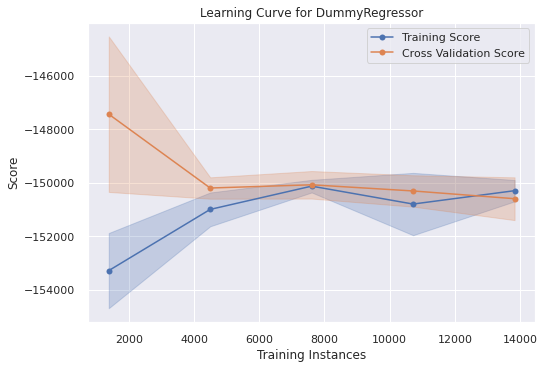

,test_neg_median_absolute_error,train_neg_median_absolute_error,test_neg_mean_absolute_percentage_error,train_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
mean,-150600.00000,-150300.0000,-0.42492,-0.42479,-375068.69908,-375398.34548
std,894.42719,447.2136,0.00717,0.00210,19104.26044,4813.15765


In [57]:
baseline = Pipeline([
    ('Data Preprocessing', data_preprocessing),
    ('Model', DummyRegressor(strategy='median'))
])

scores, history, lr, _ = evaluate_candidate_model(baseline, X_train, y_train, model_name="Baseline")
display(scores)

We see that a baseline model that predicts the median performs extremely poorly. It has a median absolute error of 150.6K USD, meaning it is typically off by a significant margin. This is much higher than the max margin of error we are allowing the model to have of 15%.

### Linear Regression

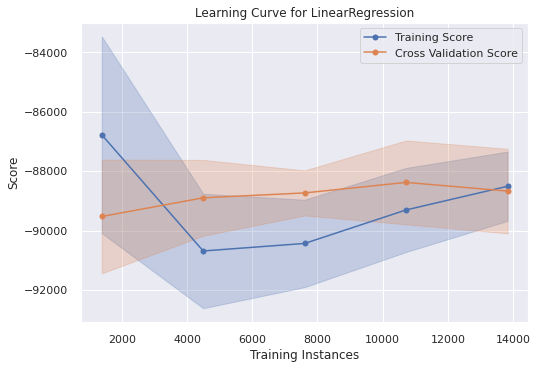

,test_neg_median_absolute_error,train_neg_median_absolute_error,test_neg_mean_absolute_percentage_error,train_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
mean,-88672.93185,-88509.94326,-0.25446,-0.25418,-201775.90380,-201162.47337
std,1590.46365,1304.01937,0.00170,0.00252,9366.05804,2339.99121


In [58]:
linreg = Pipeline([
    ('Data Preprocessing', data_preprocessing),
    ('Model', LinearRegression())
])

scores, history, lr, _ = evaluate_candidate_model(linreg, X_train, y_train, model_name="Linear Regression")
display(scores)

A basic linear regression model performs much better than the baseline, having approximately half of the median absolute error of the baseline. (88.6K USD). We also see that the variance of the model appears to be small, as the difference between the training and cross validation scores is low. This suggests that the linear regression model does not require regularization.

## Model Improvement

### Attempting Different Methods of Feature Scaling

### Transforming the Target Variable

### Converting Latitute and Longitude to ECEF Coordinates

### Considering Proximity to Waterfront

### Adding Indicator Values (Feature Binning)

### Feature Selection

### Hyperparameter Tuning

## Final Model

## Model Evaluation

### Residual Plot

### Feature Importances

## Conclusion